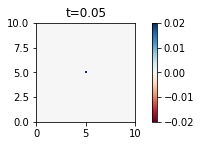

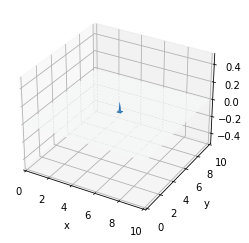

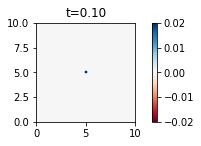

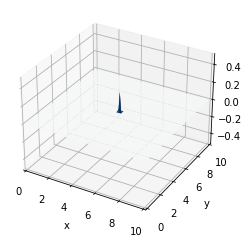

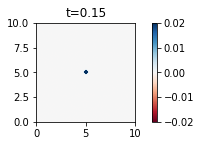

...

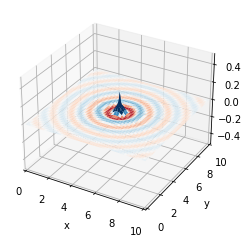

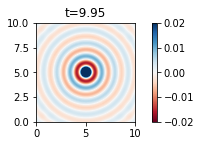

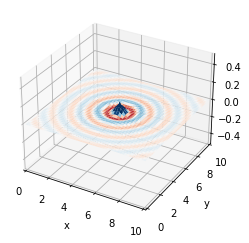

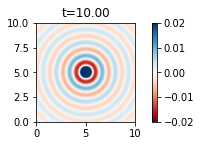

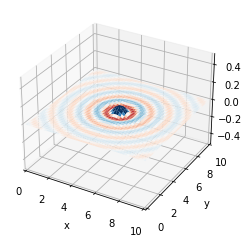

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Equation
# wtt = c^2 wxx + c^2 wyy + c^2 wzz + f

# Domain
# space
Lx = 10
Ly = 10
Lz = 10
dx = 0.1
dy = dx
dz = dx
nx = int(Lx/dx)
ny = int(Ly/dy)
nz = int(Lz/dz)
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
z = np.linspace(0, Lz, nz)

# time
T = 10

# field variables
# variables
wn = np.zeros((nx, ny, nz))
wnm1 = wn  # w at time n-1
wnp1 = wn  # w at time n+1

# parameters
CFL = 0.5
c = 1
dt = CFL*dx/c

# initial conditions

# time stepping loop
t = 0

while t < T:
    # Reflecting boundary conditions
#     wn[:,[0,-1],:] = 0
#     wn[[0,-1],:,:] = 0
#     wn[:,:, [0,-1]] = 0
    
     # Absorbing boundary conditions
    wnp1[0,:,:] = wn[1,:,:] + ((CFL - 1)/(CFL + 1)) * (wnp1[1,:,:] - wn[0,:,:])
    wnp1[-1,:,:] = wn[-2,:,:] + ((CFL - 1)/(CFL + 1)) * (wnp1[-2,:,:] - wn[-1,:,:])
    wnp1[:,0,:] = wn[:,1,:] + ((CFL - 1)/(CFL + 1)) * (wnp1[:,1,:] - wn[:,0,:])
    wnp1[:,-1,:] = wn[:,-2,:] + ((CFL - 1)/(CFL + 1)) * (wnp1[:,-2,:] - wn[:,-1,:])
    wnp1[:,:,0] = wn[:,:,1] + ((CFL - 1)/(CFL + 1)) * (wnp1[:,:,1] - wn[:,:,0])
    wnp1[:,:,-1] = wn[:,:,-2] + ((CFL - 1)/(CFL + 1)) * (wnp1[:,:,-2] - wn[:,:,-1])

    # solution
    t = t + dt
    wnm1 = wn.copy()
    wn = wnp1.copy()  # saving current and previous arrays

    # source
    wn[50,50,50] = dt**2 * 200 * np.sin(30*np.pi*t/20)

    for i in range(1, nx-1):
        for j in range(1, ny-1):
            for k in range(1, nz-1):
                wnp1[i,j,k] = 2*wn[i,j,k] - wnm1[i,j,k] \
                    + CFL**2 * (wn[i+1,j,k] + wn[i,j+1,k] + wn[i,j,k+1] - 6*wn[i,j,k] + wn[i-1,j,k] + wn[i,j-1,k] + wn[i,j,k-1])

    # check convergence
    # visualize at selected steps
    plt.clf()
    plt.subplot(2,1,1)
    im=plt.imshow(wn[:,:,nz//2].T, origin='lower', extent=[0,Lx,0,Ly],cmap='RdBu', vmin=-0.02, vmax=0.02)
    plt.colorbar(im)
    plt.clim([-0.02,0.02])
    plt.title('t={:.2f}'.format(t))
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    X, Y = np.meshgrid(x, y)
    ax.plot_surface(X, Y, wn[:,:,nz//2].T, cmap='RdBu', vmin=-0.02, vmax=0.02)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_xlim3d(0, Lx)
    ax.set_ylim3d(0, Ly)
    ax.set_zlim3d(-0.5, 0.5)
    plt.show()
    plt.pause(0.05)